## CATS Tutorial 1: Pawprints

In [2]:
import numpy as np

import astropy.units as u
import astropy.table as at

import pandas as pd
from matplotlib.patches import Polygon
from matplotlib import pyplot as plt
import matplotlib as mpl
from matplotlib.patches import PathPatch
import importlib

In [3]:
# requires pip install of this package after cloning from github
from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs
from cats.proper_motions import ProperMotionSelection, rough_pm_poly

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.


The way this is currently constructed, creating the pawprints requires knowledge of the stream beforehand. We continue to emphasize that this is meant to be used for **characterization** not **discovery**.

In [4]:
# Choose the stream and load in the data for that stream. As currently constructed, data must consist of ... columns
stream='GD-1'

gd1_properties = dict(
                    # galstream stuff
                    short_name="GD-1",
                    pawprint_id="pricewhelan2018",
    
                    # stream stuff
                    width=2.0,  # full width in degrees (without units) 
                                #  at some point will be able to take this from galstreams as well
    
                    # data stuff
                    phot_survey="PS1", # photometric survey
                    band1="g",
                    band2="r",
                    mag="g0",
                    color1="g0",
                    color2="r0",
                    minmag=16.0,
                    maxmag=24.0,
    
                    # isochrone stuff
                    age=11.8,  # Gyr
                    feh=-1.5,
                    distance=8.3,  # kpc
                    turnoff=17.8,  # mag of MS turnoff
                    scale_err=2,
                    base_err=0.075,
                    bin_sizes=[0.03, 0.2],  # xbin and ybin width for CMD
                )

# change file path according to your machine
filename = "../../cats/data/joined-{}.fits".format(gd1_properties['short_name'])
data = at.Table.read(filename)

Note that for some streams, it may be beneficial to mask globular clusters in the area. I have included at the bottom of this notebook a function for doing that which uses a txt file: cats/data/gc.txt

In [5]:
p = Pawprint.pawprint_from_galstreams(gd1_properties['short_name'],
                                      gd1_properties['pawprint_id'],
                                      width=gd1_properties['width'] * u.deg,
                                      phi1_lim=(np.min(data['phi1']), np.max(data['phi1'])))

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track


This creates the pawprint structure that will hold all the information for the stream as we make selections in other spaces. It immediately also creates an on-sky footprint for the stream region and a background region based on the width of the stream. Let's quickly see what these two regions look like.

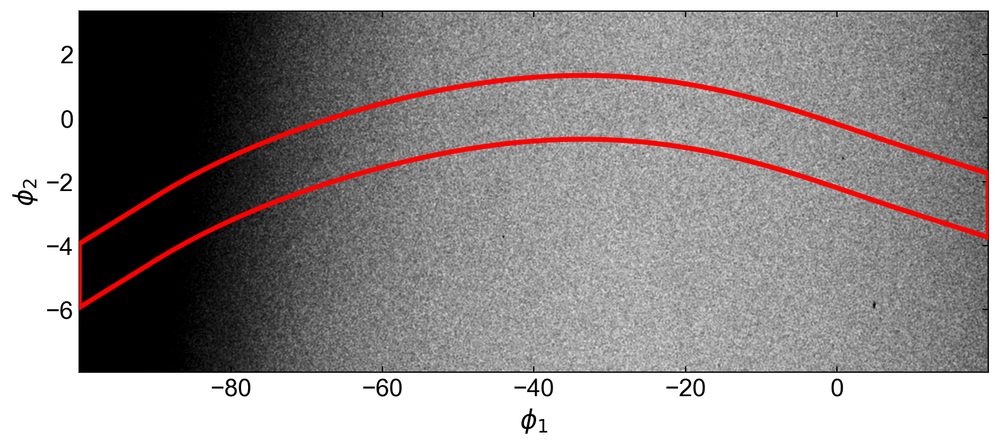

In [6]:
fig, ax = plt.subplots(1,1,figsize=(10,4))

ax.scatter(data['phi1'], data['phi2'], s=0.0001, c='k')

patch_stream = PathPatch(
        p.skyprint['stream'].footprint,
        facecolor="none",
        edgecolor="red",
        linewidth=3,
        zorder=10,
    )

ax.add_patch(patch_stream)
ax.set_xlim(np.min(data['phi1']), np.max(data['phi1']))
ax.set_ylim(np.min(data['phi2']), np.max(data['phi2']))
ax.set_xlabel(r'$\phi_1$', fontsize=16)
ax.set_ylabel(r'$\phi_2$', fontsize=16)
plt.show()

Next we make an initial pass at cutting the data by making a very broad cut in proper motion space which should be complete. Doing this reduces the size of the dataset without affecting the completeness and makes the rest of the process more efficient.

We do this by taking the galstreams proper motion tracks and drawing a box around them, including a buffer. Since the proper motion tracks should have minima and maxima that correspond to the extremes of proper motion values for stream stars, this should capture all stream stars.

In [7]:
# rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, data, buffer=2)

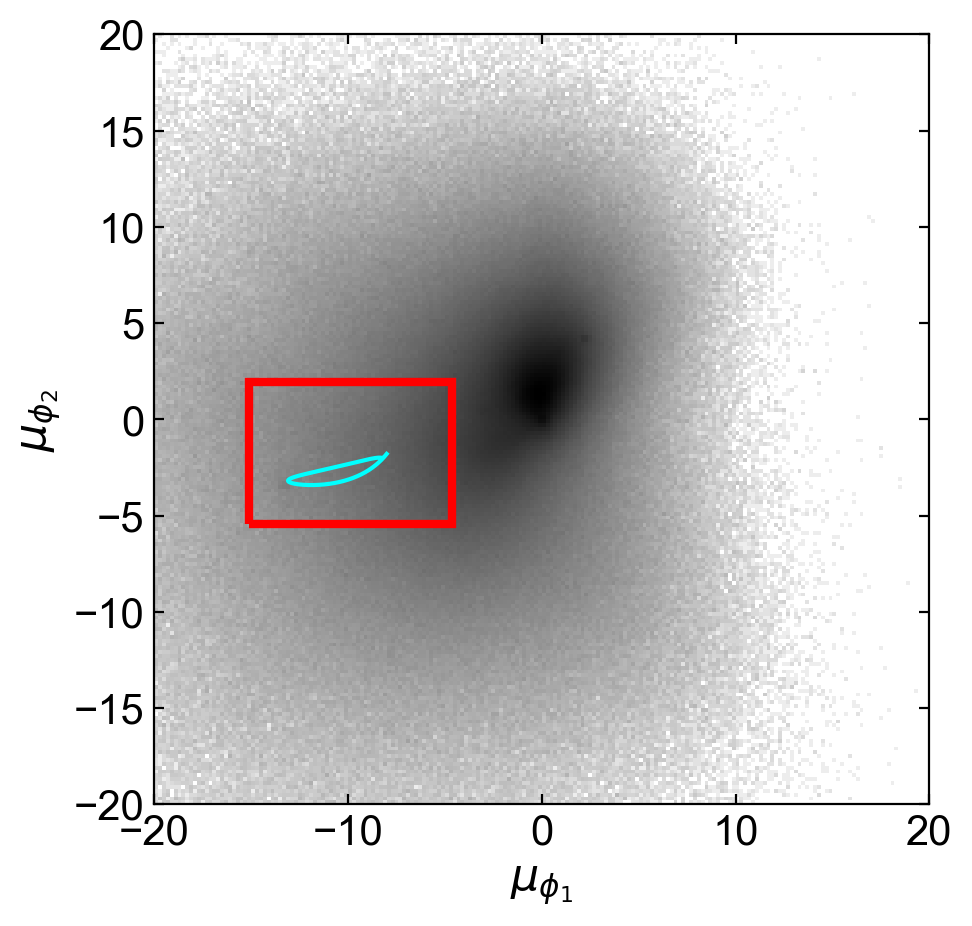

In [8]:
fig, ax = plt.subplots(1,1,figsize=(5,5))

ax.hist2d(data['pm_phi1_cosphi2_unrefl'], data['pm_phi2_unrefl'], bins=200, range=[[-20,20],[-20,20]],
          norm=mpl.colors.LogNorm(), cmap='gray_r')

stream_fr = p.track.stream_frame
track = p.track.track.transform_to(stream_fr)
ax.plot(track.pm_phi1_cosphi2, track.pm_phi2, color="cyan")

patch_stream = PathPatch(
        p.pmprint.footprint,
        facecolor="none",
        edgecolor="red",
        linewidth=3,
        zorder=10,
    )

ax.add_patch(patch_stream)
ax.set_xlim(-20, 20) ; ax.set_ylim(-20,20)
ax.set_xlabel(r'$\mu_{\phi_1}$', fontsize=16)
ax.set_ylabel(r'$\mu_{\phi_2}$', fontsize=16)
plt.show()

Having add this selection to the pawprint object, we can now use it moving forward. Next step is to make a selection in CMD space. Recall that because this is stream characterization and we should have information on these streams already, we should have isochrone parameters we can make use of. This code takes that isochrone, distance corrects the stars in the stream if there is a distance gradient and creates a pawprint and a selection from that.

In [9]:
# Create the CMD cuts
o = Isochrone(data, gd1_properties, pawprint=p)
_, iso_mask, _, hb_mask, pprint = o.simpleSln(maxmag=22, mass_thresh=0.83)

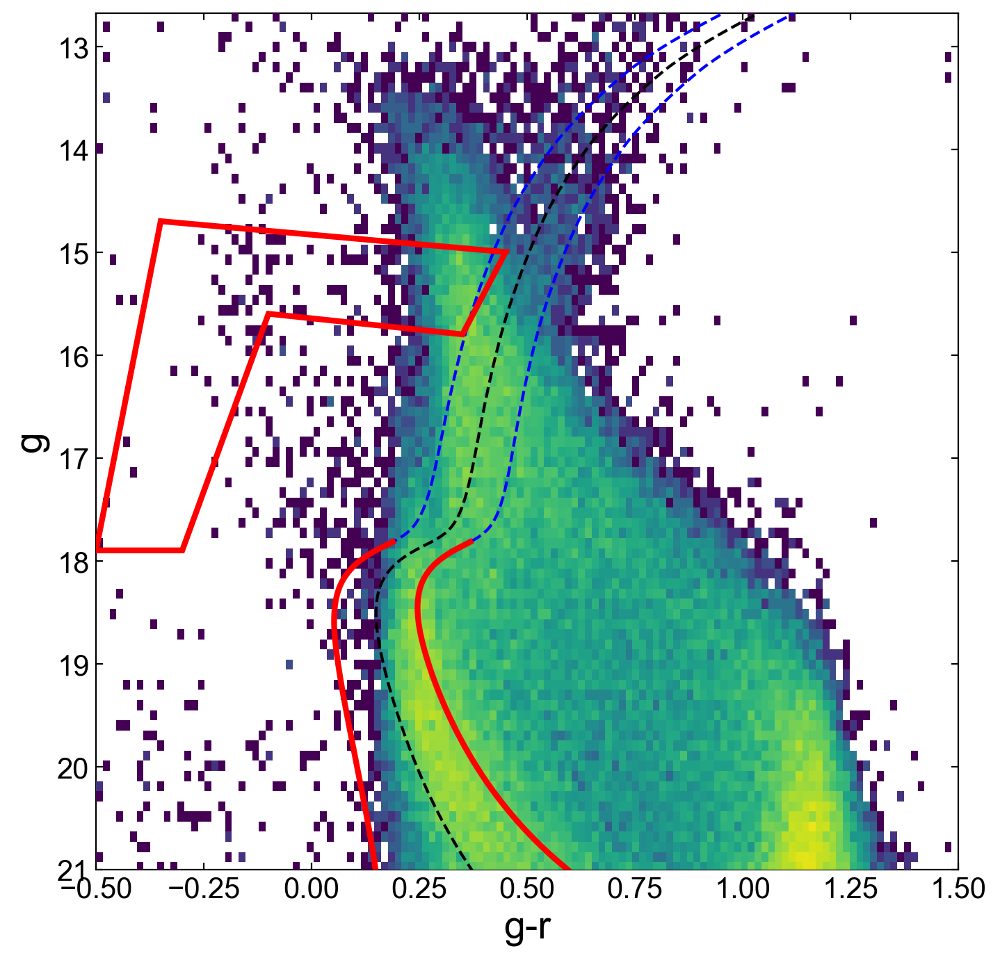

In [10]:
fig = o.plot_CMD()

Now we do an iteration back to the proper motion selection. let's use the CMD polygon to make a more refined proper motion cut.  The code will fit for the peak proper motion overdensity. There are a couple ways to do this, with increasing levels of complexity. 
1. No fitting, the same rough proper motion selection as before (100% complete, not pure at all)
2. Fit to the raw data, does not account for proper motion variation along the stream (relatively complete and pure in the highest density stream region, very incomplete and impure outside this region)
3. Use galstreams proper motion tracks to account for proper motion variation, fit to corrected data (quite complete and pure everywhere assuming accuracy of galstreams)
4. No fitting, use galstreams proper motion tracks to select in $\phi_1 - \mu_{\phi_1}$ and $\phi_1 - \mu_{\phi_2}$ space (if galstreams is accurate, very complete and pure)

-40.18182128833206
Fitting for peak pm location
Pre-fitting mean PM values: -13.031, -3.108
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [-13.2765824411502, -3.1631661457594973, 0.4018776191208751, 0.5346353001205577] 

Producing the polygon and mask


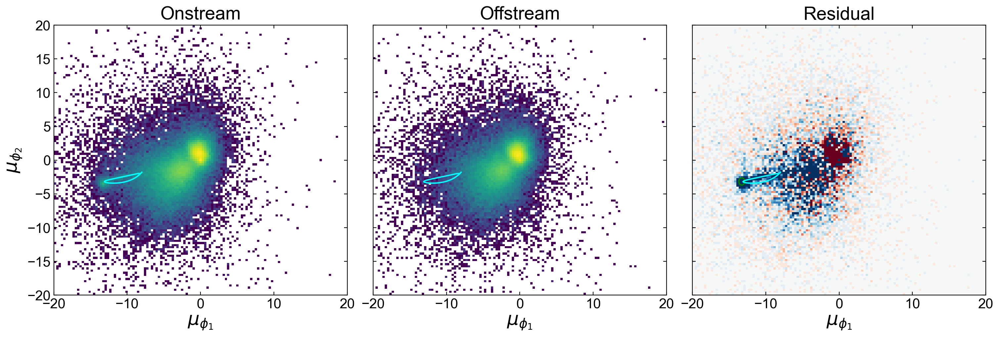

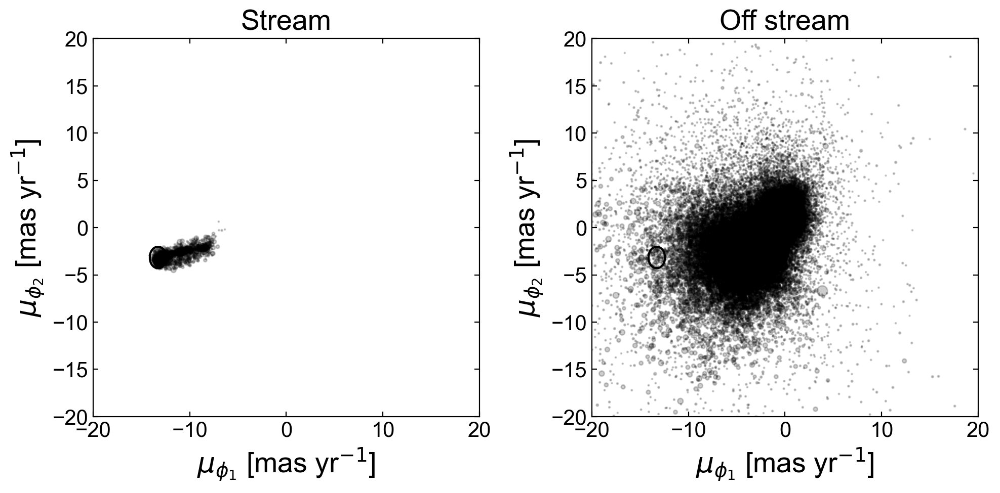

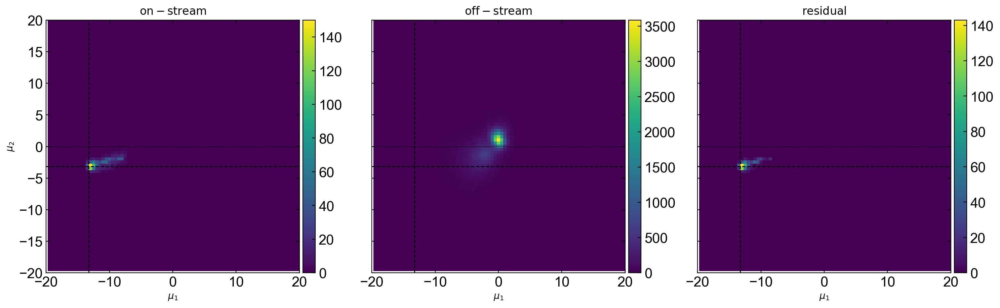

In [11]:
pmsel = ProperMotionSelection(data, gd1_properties, pprint,
                             plot=True)

Now using this proper motion selection, which should significantly reduce the number of stars that pass the cuts, we can revisit and refine the CMD selection. It is possible/likely that our isochrone is slightly misaligned with the actual stream CMD track.

So we can also fit stars in this space by keeping the shape of the isochrone constant but shifting it in both color and magnitude until it provides the best fit to the data.

In [12]:
o = Isochrone(data, gd1_properties, pawprint=pmsel.pawprint,)

_, iso_mask, _, hb_mask, pprint = o.simpleSln(22, mass_thresh=0.83)

/Users/Tavangar/Work/CATS_Workshop/cats/cats/CMD.py:291: RuntimeWarning: invalid value encountered in divide
  signal = signal / signal_counts


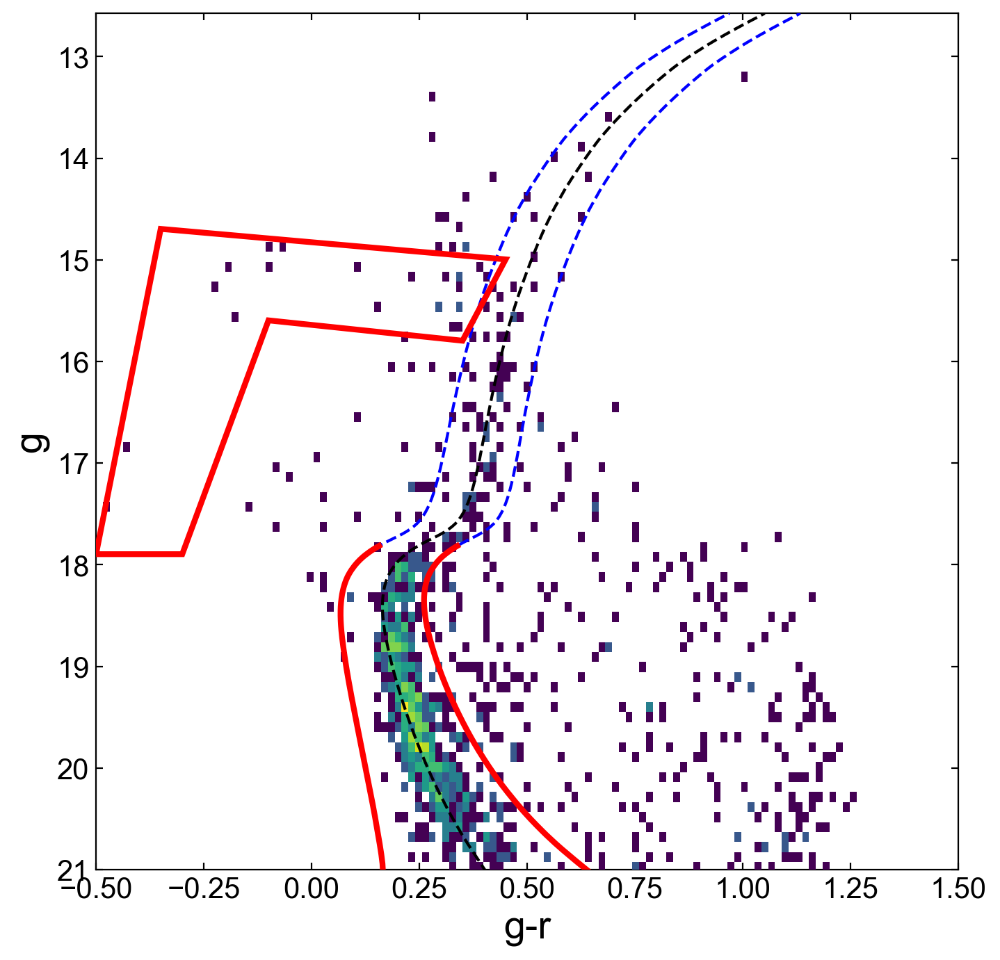

In [13]:
fig = o.plot_CMD()

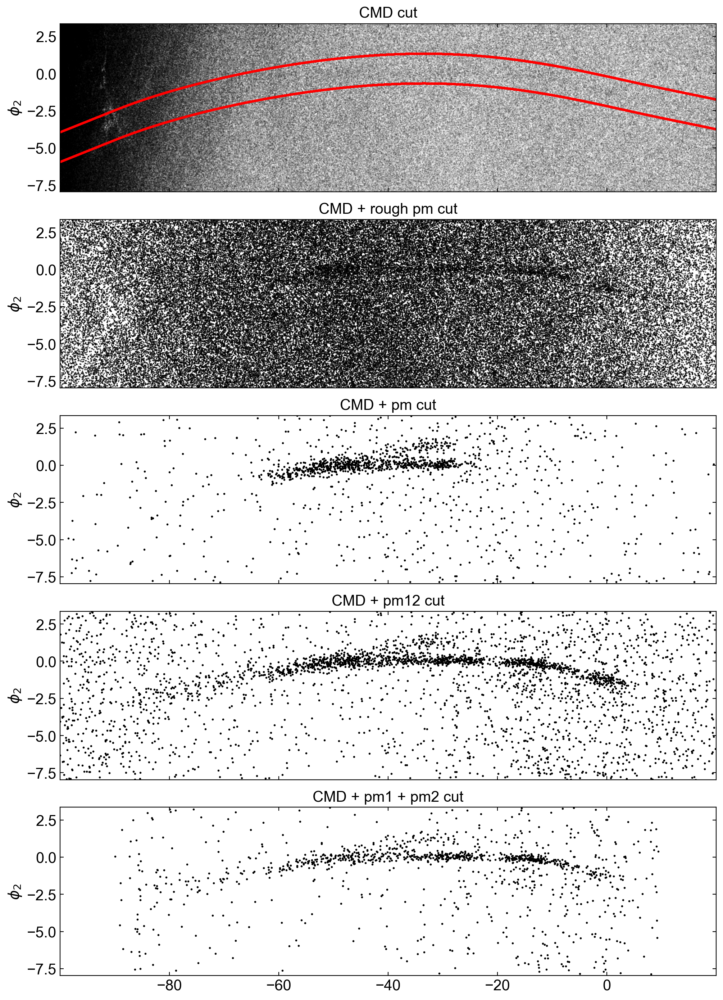

In [14]:
%matplotlib inline

fig, [ax1, ax2, ax3, ax4, ax5] = plt.subplots(5, 1, figsize=(10, 14), sharex=True)

ax1.scatter(o.cat[iso_mask | hb_mask]['phi1'], 
            o.cat[iso_mask | hb_mask]['phi2'], s=0.001, c='k')
ax1.scatter(pprint.skyprint['stream'].vertices[:,0], 
            pprint.skyprint['stream'].vertices[:,1], s=1, c='r')
ax1.set_title('CMD cut', fontsize=15)

ax2.scatter(o.cat[pmsel.rough_pm_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.rough_pm_mask & (iso_mask | hb_mask)]['phi2'], s=0.1, c='k')
ax2.set_title('CMD + rough pm cut', fontsize=15)

ax3.scatter(o.cat[pmsel.pm_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax3.set_title('CMD + pm cut', fontsize=15)

ax4.scatter(o.cat[pmsel.pm12_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm12_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax4.set_title('CMD + pm12 cut', fontsize=15)

ax5.scatter(o.cat[pmsel.pm1_mask & pmsel.pm2_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm1_mask & pmsel.pm2_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax5.set_title('CMD + pm1 + pm2 cut', fontsize=15)

# ax5.set_xlabel(r'$\phi_1$', fontsize=15)
ax1.set_ylabel(r'$\phi_2$', fontsize=15)
ax2.set_ylabel(r'$\phi_2$', fontsize=15)
ax3.set_ylabel(r'$\phi_2$', fontsize=15)
ax4.set_ylabel(r'$\phi_2$', fontsize=15)
ax5.set_ylabel(r'$\phi_2$', fontsize=15)

ax5.set_xlim(np.min(o.cat['phi1']), np.max(o.cat['phi1']))
ax1.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax2.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax3.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax4.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax5.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))

fig.tight_layout()
plt.show()

## Jhelum Example

In [15]:
stream='Jhelum'
fn = "../data/joined-{}.fits".format(stream)
cat = at.Table.read(fn)

In [16]:
jhelum_inputs = dict(
                    # galstream stuff
                    short_name="Jhelum-b",
                    pawprint_id="bonaca2019",
                    # stream stuff
                    width=2.0,  # degrees (add units in pawprint)
                    # data stuff
                    phot_survey="des",
                    band1="g",
                    band2="r",
                    mag="g0",
                    color1="g0",
                    color2="r0",
                    minmag=16.0,
                    maxmag=24.0,
                    # isochrone stuff
                    age=12,  # Gyr
                    feh=-1.7,
                    distance=13.2,  # kpc
                    turnoff=15,  # mag of MS turnoff
                    scale_err=2,
                    base_err=0.075,
                    bin_sizes=[0.03, 0.2],
                )

In [27]:
p = Pawprint.pawprint_from_galstreams(jhelum_inputs['short_name'],
                                      jhelum_inputs['pawprint_id'],
                                      width=jhelum_inputs['width'] * u.deg, 
                                      phi1_lim = None)

# rough pm cut to start with
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=1)

o = Isochrone(cat, jhelum_inputs, pawprint=p)

_, iso_mask, _, hb_mask, pprint = o.simpleSln(maxmag=22, mass_thresh=0.83)

Defining length of the track according to galstreams
Defining length of the track according to galstreams


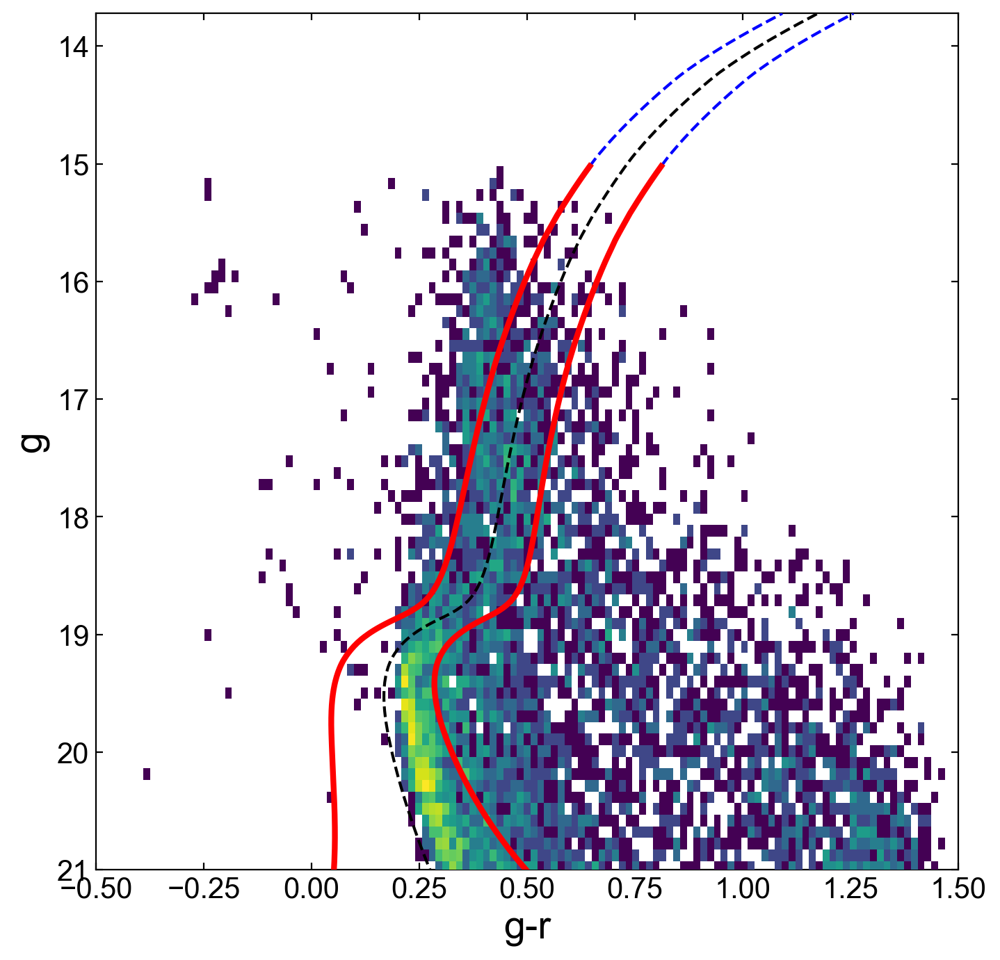

In [28]:
fig = o.plot_CMD()

2.6490062007232355e-05
Fitting for peak pm location
Pre-fitting mean PM values: -7.481, 3.417
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [-7.248687499702731, 3.450471216427474, 0.7596320875533088, 0.42528669436788774] 

Producing the polygon and mask


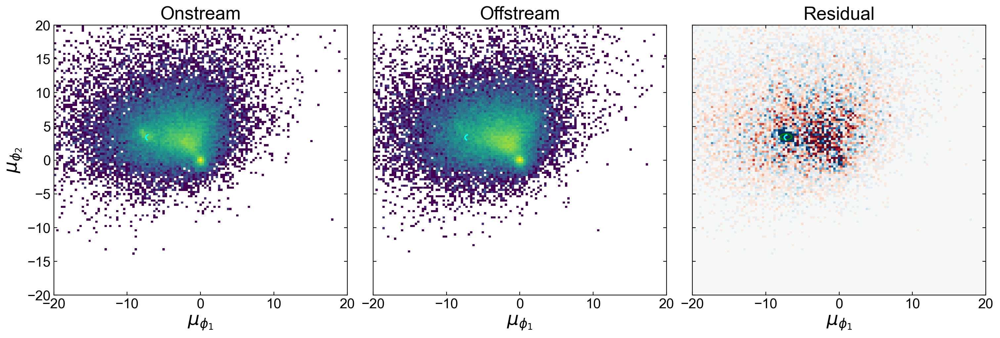

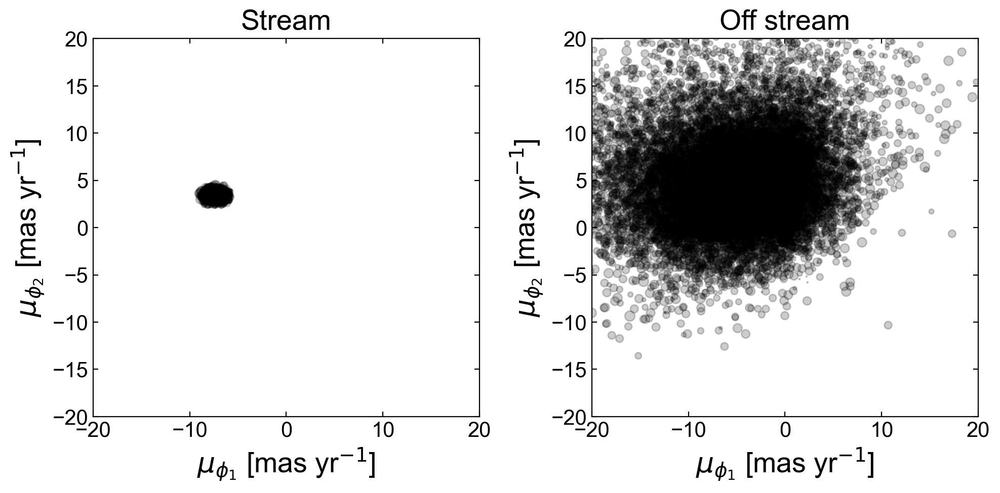

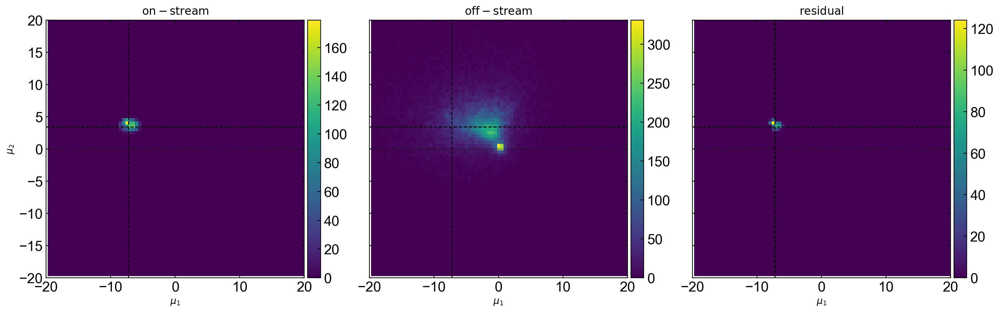

In [29]:
pmsel = ProperMotionSelection(cat, jhelum_inputs, pprint,
                              n_dispersion_phi1=3, n_dispersion_phi2=3, cutoff=0.1,
                              plot=True)

In [32]:
o = Isochrone(cat, jhelum_inputs, pawprint=pmsel.pawprint,)

_, iso_mask, _, hb_mask, pprint = o.simpleSln(22, mass_thresh=0.83)

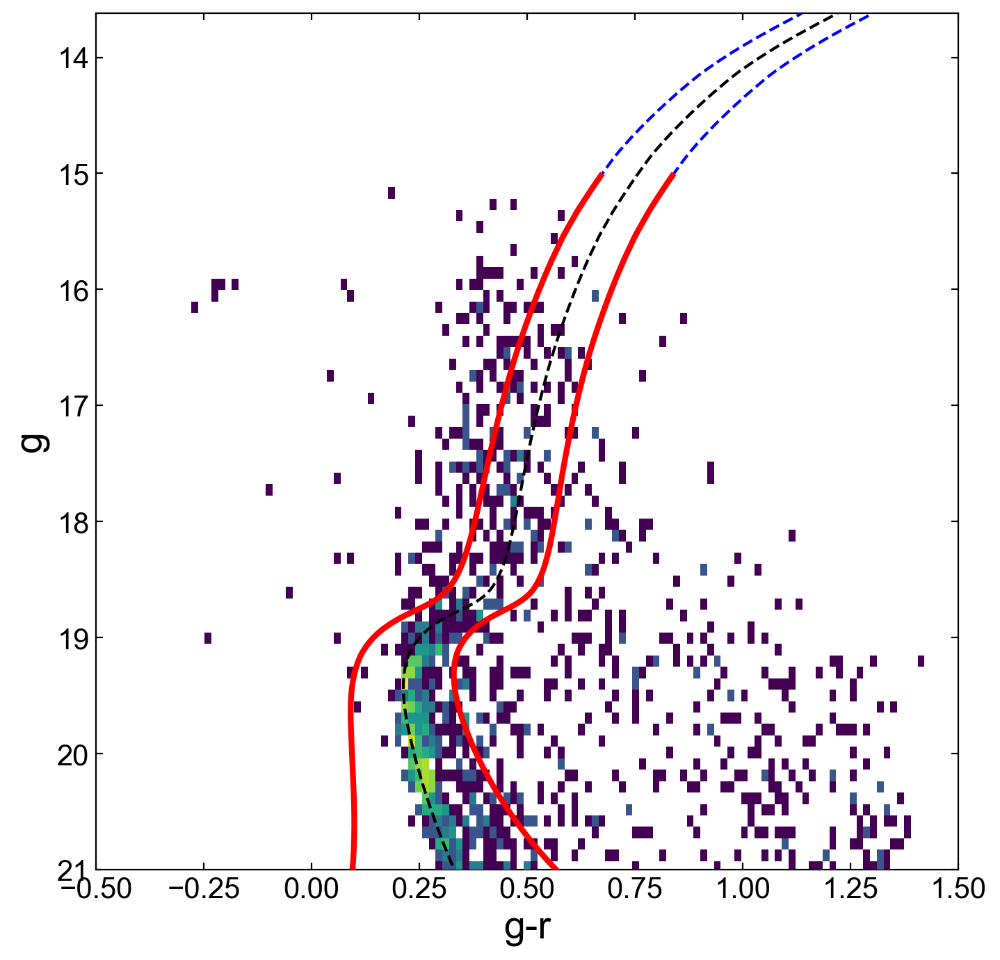

In [33]:
fig = o.plot_CMD()

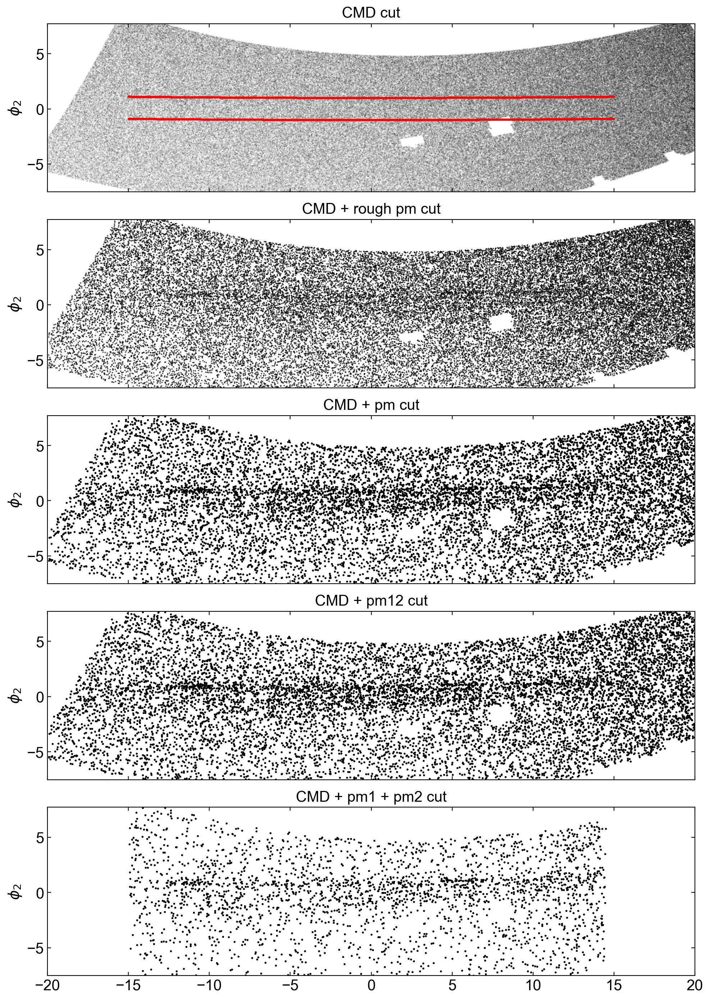

In [34]:
%matplotlib inline

fig, [ax1, ax2, ax3, ax4, ax5] = plt.subplots(5, 1, figsize=(10, 14), sharex=True)

ax1.scatter(o.cat[iso_mask | hb_mask]['phi1'], 
            o.cat[iso_mask | hb_mask]['phi2'], s=0.001, c='k')
ax1.scatter(pprint.skyprint['stream'].vertices[:,0], 
            pprint.skyprint['stream'].vertices[:,1], s=1, c='r')
ax1.set_title('CMD cut', fontsize=15)

ax2.scatter(o.cat[pmsel.rough_pm_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.rough_pm_mask & (iso_mask | hb_mask)]['phi2'], s=0.1, c='k')
ax2.set_title('CMD + rough pm cut', fontsize=15)

ax3.scatter(o.cat[pmsel.pm_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax3.set_title('CMD + pm cut', fontsize=15)

ax4.scatter(o.cat[pmsel.pm12_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm12_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax4.set_title('CMD + pm12 cut', fontsize=15)

ax5.scatter(o.cat[pmsel.pm1_mask & pmsel.pm2_mask & (iso_mask | hb_mask)]['phi1'], 
            o.cat[pmsel.pm1_mask & pmsel.pm2_mask & (iso_mask | hb_mask)]['phi2'], s=1, c='k')
ax5.set_title('CMD + pm1 + pm2 cut', fontsize=15)

# ax5.set_xlabel(r'$\phi_1$', fontsize=15)
ax1.set_ylabel(r'$\phi_2$', fontsize=15)
ax2.set_ylabel(r'$\phi_2$', fontsize=15)
ax3.set_ylabel(r'$\phi_2$', fontsize=15)
ax4.set_ylabel(r'$\phi_2$', fontsize=15)
ax5.set_ylabel(r'$\phi_2$', fontsize=15)

ax5.set_xlim(np.min(o.cat['phi1']), np.max(o.cat['phi1']))
ax1.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax2.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax3.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax4.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))
ax5.set_ylim(np.min(o.cat['phi2']), np.max(o.cat['phi2']))

fig.tight_layout()
plt.show()